In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers, models, backend as K
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, Concatenate, Dropout

#Загрузка набора данных

In [ ]:
import os
from google.colab import userdata

kaggle_config = userdata.get('Kagle')

In [ ]:
# Теперь можно сразу скачивать
!kaggle datasets download -d balraj98/deepglobe-land-cover-classification-dataset

Dataset URL: https://www.kaggle.com/datasets/balraj98/deepglobe-land-cover-classification-dataset
License(s): other
100% 2.74G/2.74G [00:35<00:00, 82.3MB/s]



In [ ]:
!mkdir -p dataset

In [ ]:
!unzip -q deepglobe-land-cover-classification-dataset.zip -d dataset/

#Подготовка данных

In [ ]:
BASE_DIR = "/content/dataset"
DATASET_DIR = BASE_DIR
MASK_CSV = os.path.join(BASE_DIR, "class_dict.csv")

In [ ]:
if not os.path.exists(MASK_CSV):
    print(f"Ошибка! Файл {MASK_CSV} не найден. Проверьте, куда распаковался датасет.")
else:
    # Load class mapping
    class_df = pd.read_csv(MASK_CSV)
    class_rgb_values = class_df[['r', 'g', 'b']].values.tolist()
    class_names = class_df['name'].tolist()
    n_classes = len(class_names)
    print(f"Загружено классов: {n_classes} ({', '.join(class_names)})")

Загружено классов: 7 (urban_land, agriculture_land, rangeland, forest_land, water, barren_land, unknown)


In [ ]:
def rgb_to_mask(mask, class_rgb_values):
    semantic_map = np.zeros(mask.shape[:2], dtype=np.uint8)
    for idx, color in enumerate(class_rgb_values):
        semantic_map[np.all(mask == color, axis=-1)] = idx
    return semantic_map

def mask_to_rgb(mask, class_rgb_values):
    rgb_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for idx, color in enumerate(class_rgb_values):
        rgb_mask[mask == idx] = color
    return rgb_mask

In [ ]:
# Исправляем путь на папку train
DATASET_DIR = "/content/dataset/train"

# Загружаем пути
image_paths = sorted(glob(os.path.join(DATASET_DIR, '*_sat.jpg')))
mask_paths = sorted(glob(os.path.join(DATASET_DIR, '*_mask.png')))

# Проверка результата
if len(image_paths) == 0:
    print(f"ВНИМАНИЕ: В папке {DATASET_DIR} не найдено картинок. Проверьте путь!")
elif len(mask_paths) == 0:
    print(f"ВНИМАНИЕ: Картинки есть, но МАСОК в папке {DATASET_DIR} нет.")
else:
    print(f"Найдено изображений: {len(image_paths)}")
    print(f"Найдено масок: {len(mask_paths)}")


Найдено изображений: 803
Найдено масок: 803


In [ ]:
IMG_HEIGHT, IMG_WIDTH = 256, 256

def load_data(image_paths, mask_paths):
    images, masks = [], []
    for img_path, msk_path in zip(image_paths, mask_paths):
        img = np.array(Image.open(img_path).resize((IMG_WIDTH, IMG_HEIGHT))) / 255.0
        mask = np.array(Image.open(msk_path).resize((IMG_WIDTH, IMG_HEIGHT)))
        mask = rgb_to_mask(mask, class_rgb_values)
        mask = to_categorical(mask, num_classes=n_classes)
        images.append(img)
        masks.append(mask)
    return np.array(images), np.array(masks)

In [ ]:
subset_size = 600
x, y = load_data(image_paths[:subset_size], mask_paths[:subset_size])
x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=0.1, random_state=42)

Кастомная функция потерь

In [ ]:
# Dice + CrossEntropy Loss
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1 - ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))

def combined_loss(y_true, y_pred):
    ce = tf.keras.losses.CategoricalCrossentropy()(y_true, y_pred)
    d = dice_loss(y_true, y_pred)
    return ce + d

#Разработка архитектуры нейросети

In [ ]:
# Custom U-Net model
def build_unet(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), n_classes=n_classes):
    inputs = layers.Input(shape=input_shape)

    # Encoder: Downsampling
    # Block 1
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same', strides=1)(inputs)  # 256x256x64
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same', strides=1)(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)  # 128x128x64

    # Block 2
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same', strides=1)(p1)  # 128x128x128
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same', strides=1)(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)  # 64x64x128

    # Block 3
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same', strides=1)(p2)  # 64x64x256
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same', strides=1)(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)  # 32x32x256

    # Block 4
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same', strides=1)(p3)  # 32x32x512
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same', strides=1)(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)  # 16x16x512

    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same', strides=1)(p4)  # 16x16x1024
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same', strides=1)(c5)

    # Decoder: Upsampling
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=2, padding='same')(c5)  # 32x32x512
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(256, (2, 2), strides=2, padding='same')(c6)  # 64x64x256
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.Conv2DTranspose(128, (2, 2), strides=2, padding='same')(c7)  # 128x128x128
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2, 2), strides=2, padding='same')(c8)  # 256x256x64
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = layers.Conv2D(n_classes, (1, 1), activation='softmax')(c9)

    return models.Model(inputs=inputs, outputs=outputs)

In [ ]:
# Build model
model = build_unet()
model.compile(optimizer='adam', loss=combined_loss, metrics=['accuracy', MeanIoU(num_classes=n_classes)])

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 16, 16,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 16, 16,    │  9,438,208 │ conv2d_8[0][0]    │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 32, 32,    │  2,097,664 │ conv2d_9[0][0]    │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ conv2d_transpose

 Total params: 31,032,135 (118.38 MB)

 Trainable params: 31,032,135 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

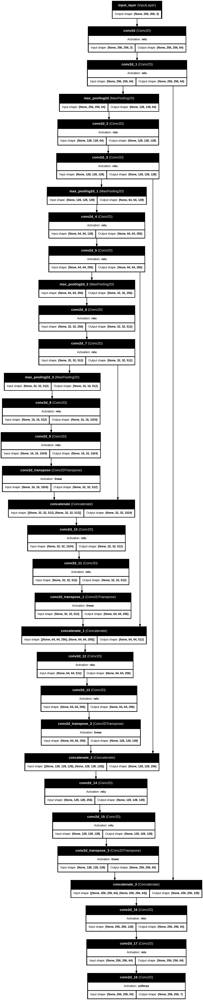

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(
    model,
    to_file='model_architecture.png',
    show_shapes=True,
    show_layer_names=True,
    show_layer_activations=True
)

##Обучение

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
save_path = '/content/drive/MyDrive/deepglobe_project'

if not os.path.exists(save_path):
    os.makedirs(save_path)

# Полный путь к файлу модели
checkpoint_file = os.path.join(save_path, 'unet_deepglobe_best.keras')

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Callbacks
early_stop = EarlyStopping(
    monitor='val_loss', patience=7, restore_best_weights=True, verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, verbose=1
)

checkpoint = ModelCheckpoint(
    checkpoint_file,
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Fit model
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=80,
    batch_size=4,
    callbacks=[early_stop, reduce_lr, checkpoint],
    verbose=1
)

Epoch 1/80
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - accuracy: 0.5161 - loss: 5.5224 - mean_io_u: 0.4337
Epoch 1: val_loss improved from None to 1.85024, saving model to /content/drive/MyDrive/deepglobe_project/unet_deepglobe_best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/deepglobe_project/unet_deepglobe_best.keras
135/135 ━━━━━━━━━━━━━━━━━━━━ 105s 411ms/step - accuracy: 0.5558 - loss: 3.0869 - mean_io_u: 0.4304 - val_accuracy: 0.5969 - val_loss: 1.8502 - val_mean_io_u: 0.4286 - learning_rate: 0.0010
Epoch 2/80
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.5655 - loss: 1.9773 - mean_io_u: 0.4286
Epoch 2: val_loss improved from 1.85024 to 1.81526, saving model to /content/drive/MyDrive/deepglobe_project/unet_deepglobe_best.keras

Epoch 2: finished saving model to /content/drive/MyDrive/deepglobe_project/unet_deepglobe_best.keras
135/135 ━━━━━━━━━━━━━━━━━━━━ 37s 274ms/step - accuracy: 0.5768 - loss: 1.9309 - mean_io_u: 0.4286 - val_accuracy: 0.5969 - v

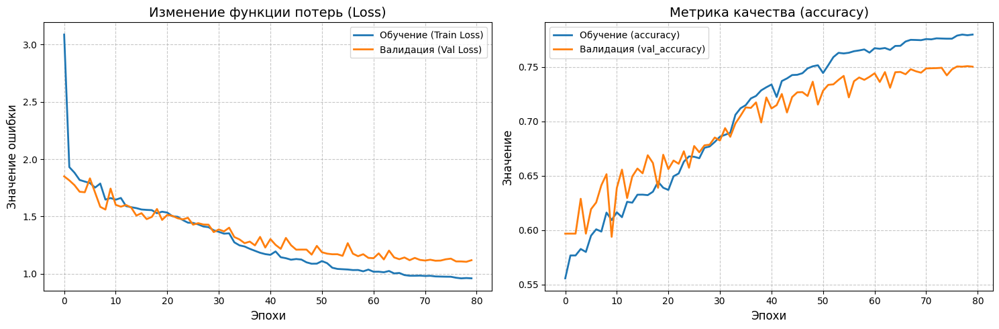

In [ ]:
hist = history.history

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(hist['loss'], label='Обучение (Train Loss)', linewidth=2)
if 'val_loss' in hist:
    ax1.plot(hist['val_loss'], label='Валидация (Val Loss)', linewidth=2)

ax1.set_title('Изменение функции потерь (Loss)', fontsize=14)
ax1.set_xlabel('Эпохи', fontsize=12)
ax1.set_ylabel('Значение ошибки', fontsize=12)
ax1.legend()
ax1.grid(True, linestyle='--', alpha=0.7)

metric_keys = [k for k in hist.keys() if k not in ['loss', 'val_loss'] and not k.startswith('val_')]

if metric_keys:
    metric_name = metric_keys[0]
    val_metric_name = 'val_' + metric_name

    ax2.plot(hist[metric_name], label=f'Обучение ({metric_name})', linewidth=2)
    if val_metric_name in hist:
        ax2.plot(hist[val_metric_name], label=f'Валидация ({val_metric_name})', linewidth=2)

    ax2.set_title(f'Метрика качества ({metric_name})', fontsize=14)
    ax2.set_xlabel('Эпохи', fontsize=12)
    ax2.set_ylabel('Значение', fontsize=12)
    ax2.legend()
    ax2.grid(True, linestyle='--', alpha=0.7)
else:
    ax2.set_title('Дополнительные метрики не найдены')

plt.tight_layout()
plt.show()

##Просмотри результатов

In [ ]:
# Predict and visualize
def visualize_predictions(model, x_data, y_data, idx=48):
    pred = model.predict(np.expand_dims(x_data[idx], axis=0))[0]
    pred_mask = np.argmax(pred, axis=-1)
    true_mask = np.argmax(y_data[idx], axis=-1)

    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(x_data[idx])
    ax[0].set_title("Input Image")
    ax[1].imshow(mask_to_rgb(true_mask, class_rgb_values))
    ax[1].set_title("Ground Truth")
    ax[2].imshow(mask_to_rgb(pred_mask, class_rgb_values))
    ax[2].set_title("Prediction")
    for a in ax: a.axis('off')
    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


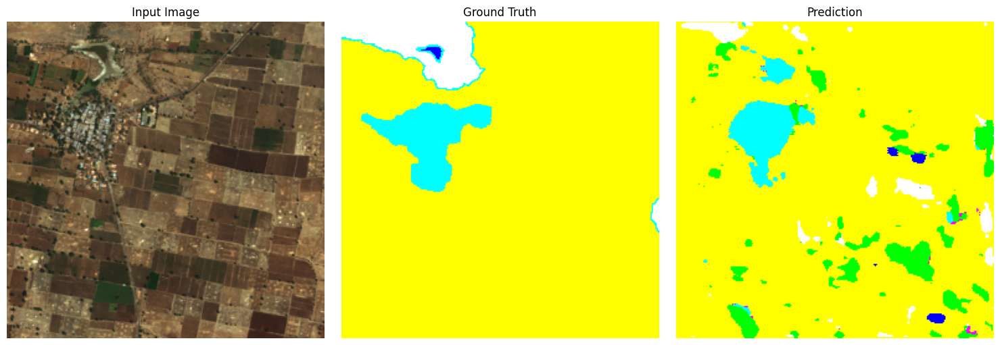

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


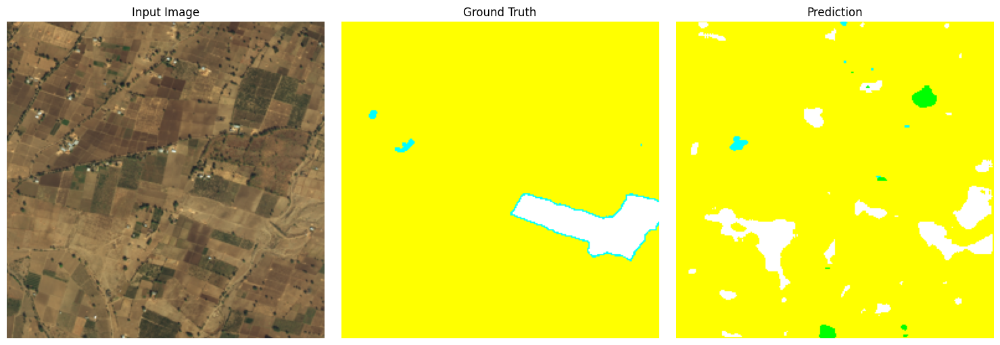

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


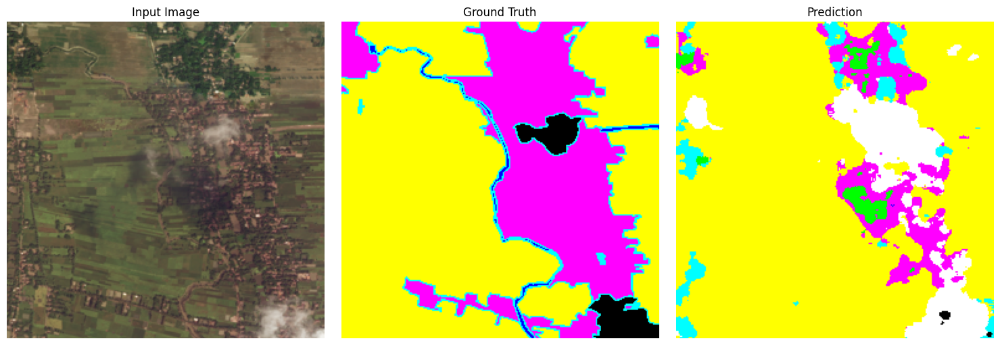

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


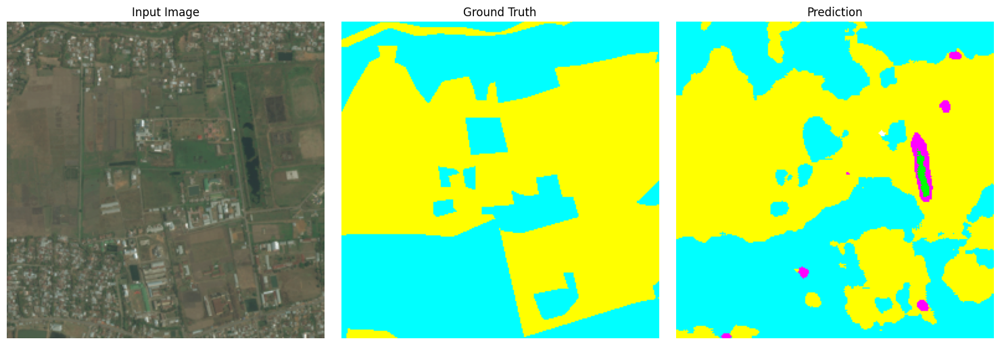

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


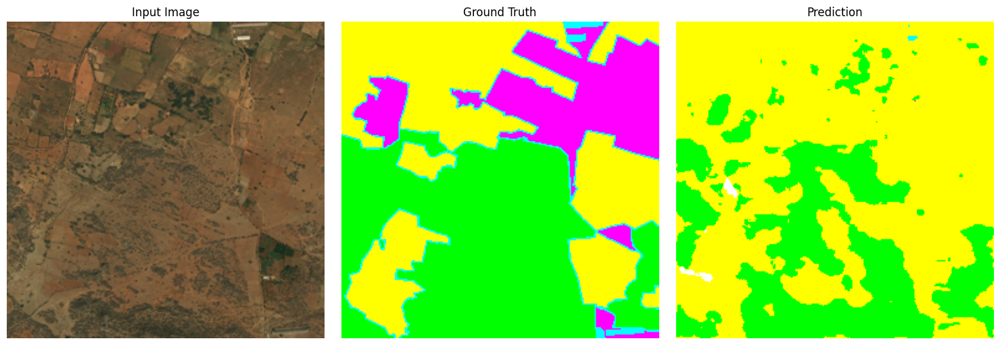

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


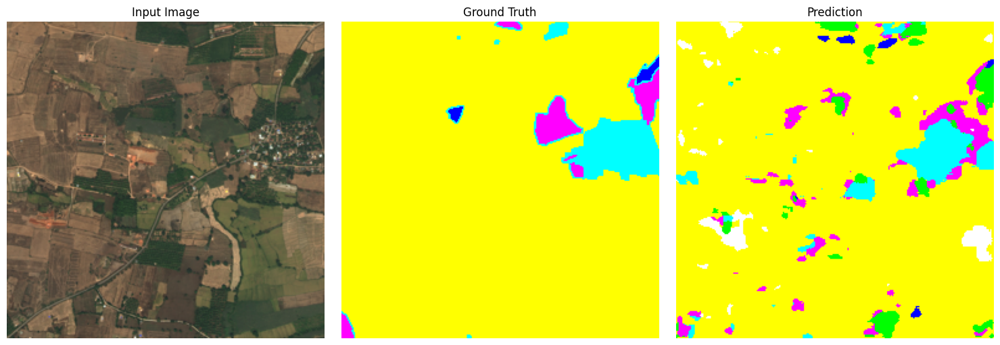

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


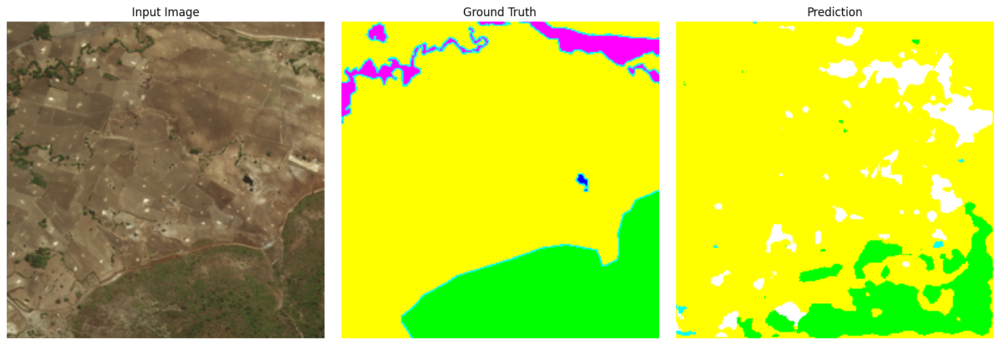

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


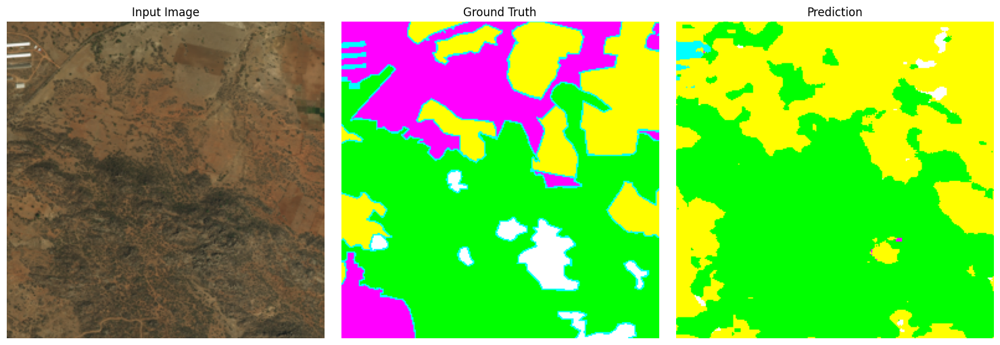

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


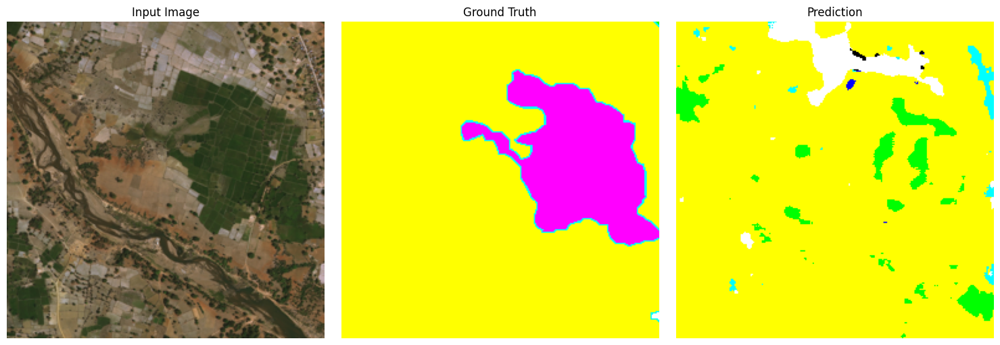

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


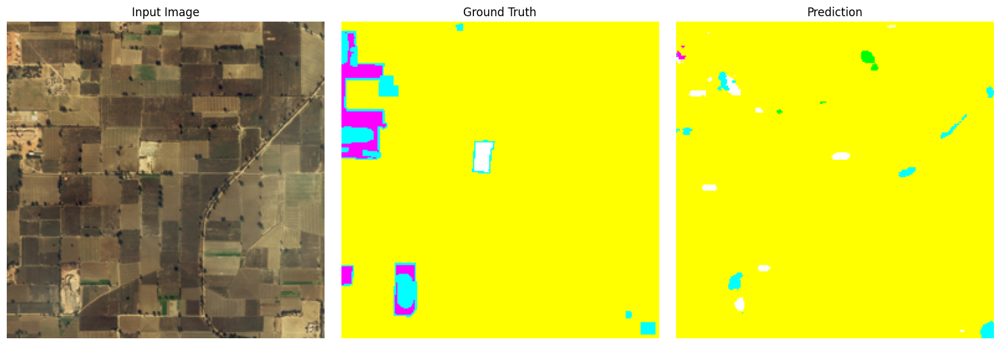

In [ ]:
# Show prediction
for idx in range(40,50):
  visualize_predictions(model, x_val, y_val,idx)

In [ ]:
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix

def evaluate_model(model, x_val, y_val, n_classes):
    y_pred = model.predict(x_val, batch_size=4)

    # Convert one-hot to class index
    y_pred_labels = np.argmax(y_pred, axis=-1).flatten()
    y_true_labels = np.argmax(y_val, axis=-1).flatten()

    # Compute confusion matrix
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=list(range(n_classes)))

    # Compute IoU for each class
    intersection = np.diag(cm)
    union = cm.sum(axis=1) + cm.sum(axis=0) - np.diag(cm)
    iou_per_class = intersection / (union + 1e-6)
    mean_iou = np.mean(iou_per_class)

    # F1 Score (macro average)
    f1 = f1_score(y_true_labels, y_pred_labels, average='macro')

    # Pixel Accuracy
    acc = accuracy_score(y_true_labels, y_pred_labels)

    print(f"Mean IoU     : {mean_iou:.4f}")
    print(f"F1 Score     : {f1:.4f}")
    print(f"Pixel Accuracy: {acc:.4f}")

    return mean_iou, f1, acc

In [ ]:
evaluate_model(model, x_val, y_val, n_classes)

15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step
Mean IoU     : 0.3894
F1 Score     : 0.5038
Pixel Accuracy: 0.7506


(np.float64(0.38938155889444614), 0.5037867075771585, 0.7506197611490886)

In [ ]:
x_test, y_test = load_data(image_paths[600:700], mask_paths[600:700])

In [ ]:
evaluate_model(model, x_test, y_test, n_classes)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step
Mean IoU     : 0.4476
F1 Score     : 0.5555
Pixel Accuracy: 0.7705


(np.float64(0.44763430106364444), 0.5555290236366781, 0.7704718017578125)

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step


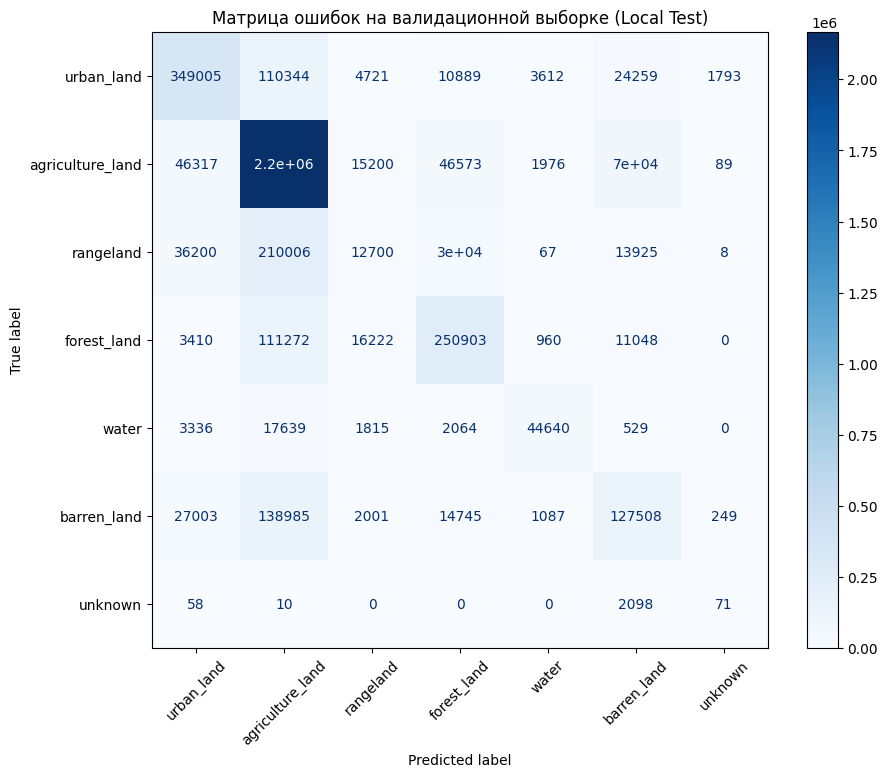

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# 1. Получаем предсказания модели на ВАЛИДАЦИОННОЙ выборке
y_pred_proba = model.predict(x_val, batch_size=4)

# 2. Переводим вероятности в индексы классов
y_pred_classes = np.argmax(y_pred_proba, axis=-1).flatten()
y_true_classes = np.argmax(y_val, axis=-1).flatten()

# 3. Строим матрицу ошибок
# n_classes - количество твоих классов
cm = confusion_matrix(y_true_classes, y_pred_classes, labels=np.arange(n_classes))

# 4. Визуализация
fig, ax = plt.subplots(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
# Если пикселей миллионы, лучше убрать параметр values_format='d' или использовать логарифмическую шкалу
disp.plot(cmap='Blues', ax=ax, xticks_rotation=45)
plt.title('Матрица ошибок на валидационной выборке (Local Test)')
plt.show()

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step


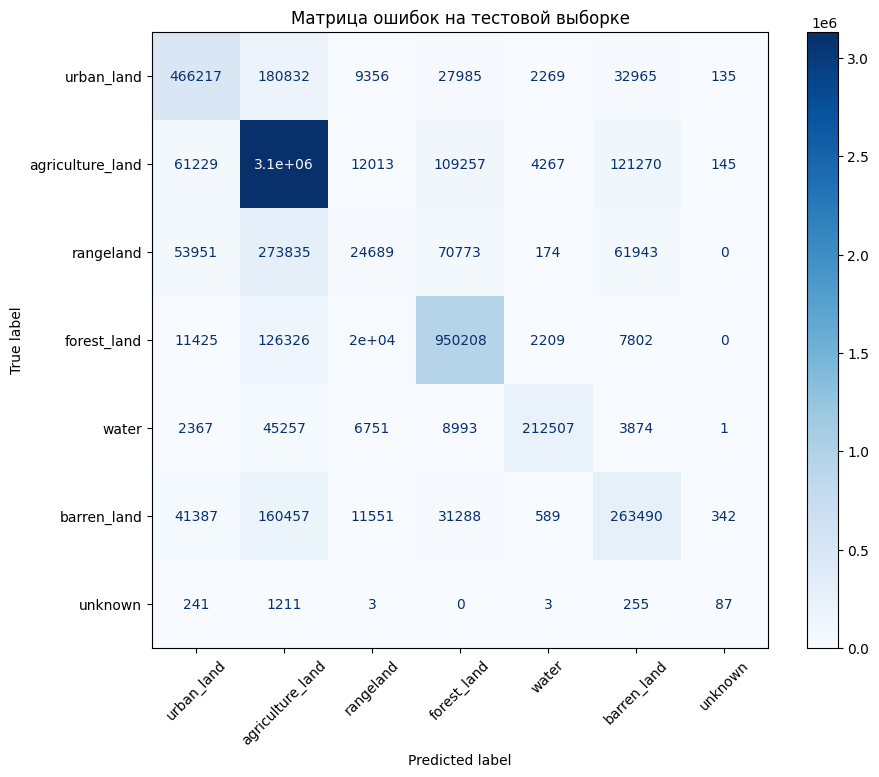

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# 1. Получаем предсказания модели на ВАЛИДАЦИОННОЙ выборке
y_pred_proba = model.predict(x_test, batch_size=4)

# 2. Переводим вероятности в индексы классов
y_pred_classes = np.argmax(y_pred_proba, axis=-1).flatten()
y_true_classes = np.argmax(y_test, axis=-1).flatten()

# 3. Строим матрицу ошибок
# n_classes - количество твоих классов
cm = confusion_matrix(y_true_classes, y_pred_classes, labels=np.arange(n_classes))

# 4. Визуализация
fig, ax = plt.subplots(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
# Если пикселей миллионы, лучше убрать параметр values_format='d' или использовать логарифмическую шкалу
disp.plot(cmap='Blues', ax=ax, xticks_rotation=45)
plt.title('Матрица ошибок на тестовой выборке')
plt.show()

In [ ]:
model.save_weights('my_unet.weights.h5')

###На train части (без масок исходных)

In [ ]:
test_dir = 'dataset/test/'
test_image_paths = glob(os.path.join(test_dir, '*.jpg'))

num_samples = min(50, len(test_image_paths))
np.random.seed(42)
sample_test_paths = np.random.choice(test_image_paths, num_samples, replace=False)

x_test_vis = []
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
for path in sample_test_paths:
    img = Image.open(path).convert('RGB')
    img = img.resize((IMG_WIDTH, IMG_HEIGHT))
    img_array = np.array(img) / 255.0
    x_test_vis.append(img_array)

x_test_vis = np.array(x_test_vis)

In [ ]:
# Получаем предсказания
print("Генерация масок...")
y_pred_test_vis = model.predict(x_test_vis, batch_size=4)
print("Готово!")

Генерация масок...
13/13 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step
Готово!


Визуализация:


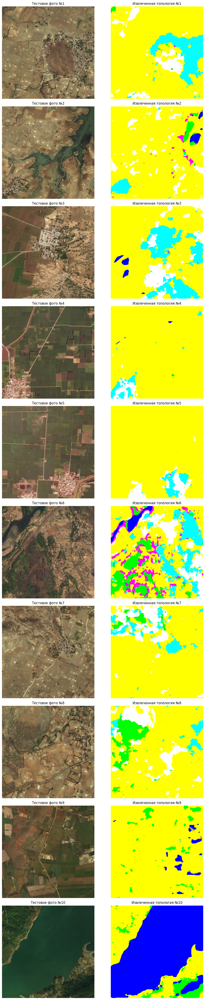

In [ ]:
def plot_few_predictions(images, preds_proba, class_rgb_values, start_idx=0, count=5):
    fig, axes = plt.subplots(count, 2, figsize=(12, 5 * count))

    for i in range(count):
        idx = start_idx + i
        if idx >= len(images):
            break

        axes[i, 0].imshow(images[idx])
        axes[i, 0].set_title(f"Тестовое фото №{idx+1}")
        axes[i, 0].axis('off')

        pred_mask = np.argmax(preds_proba[idx], axis=-1)
        pred_mask_rgb = mask_to_rgb(pred_mask, class_rgb_values)
        axes[i, 1].imshow(pred_mask_rgb)
        axes[i, 1].set_title(f"Извлеченная топология №{idx+1}")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

print("Визуализация:")
plot_few_predictions(x_test_vis, y_pred_test_vis, class_rgb_values, start_idx=0, count=10)

##Для загрузки модели

In [ ]:
import os
import tensorflow as tf
from google.colab import drive

drive.mount('/content/drive')

save_path = '/content/drive/MyDrive/deepglobe_project'
checkpoint_file = os.path.join(save_path, 'unet_deepglobe_best.keras')

print("Загрузка обученной модели из Диска...")
model = tf.keras.models.load_model(checkpoint_file, compile=False)
print("Модель успешно загружена! Память свободна и готова к работе.")